In [1]:
import os
os.chdir("../")

In [2]:
from detectron2.data.datasets import register_coco_instances
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg

# Model
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.utils.visualizer import Visualizer

# Others
from pycocotools.coco import COCO
from matplotlib import pyplot as plt
import cv2
from PIL import Image

In [3]:
register_coco_instances("spacesuit_dataset", {}, 
    "/Users/rasyidridha/Playground/spacesuit/data/annotation_2d.json", 
    "/Users/rasyidridha/Playground/spacesuit/data/raw/train/images/"
)

## Test Existing Image

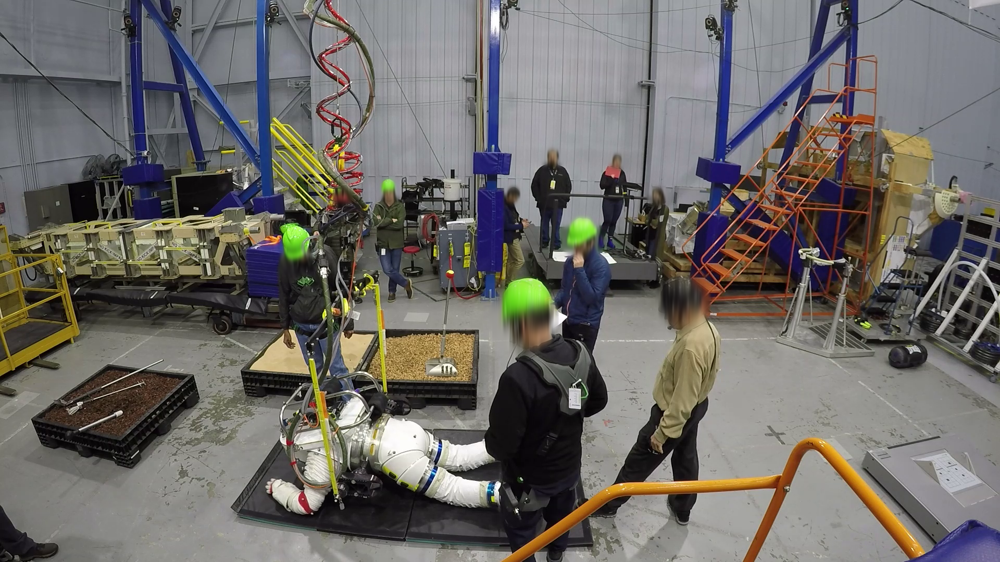

In [4]:
im = cv2.imread("data/raw/train/images/126134.jpg")
im = cv2.imread("data/raw/train/images/118330.png")
# plt.xticks([]), plt.yticks([])
# plt.imshow(im[:,:,::-1])

display(Image.fromarray(cv2.cvtColor(im, cv2.COLOR_BGR2RGB)))

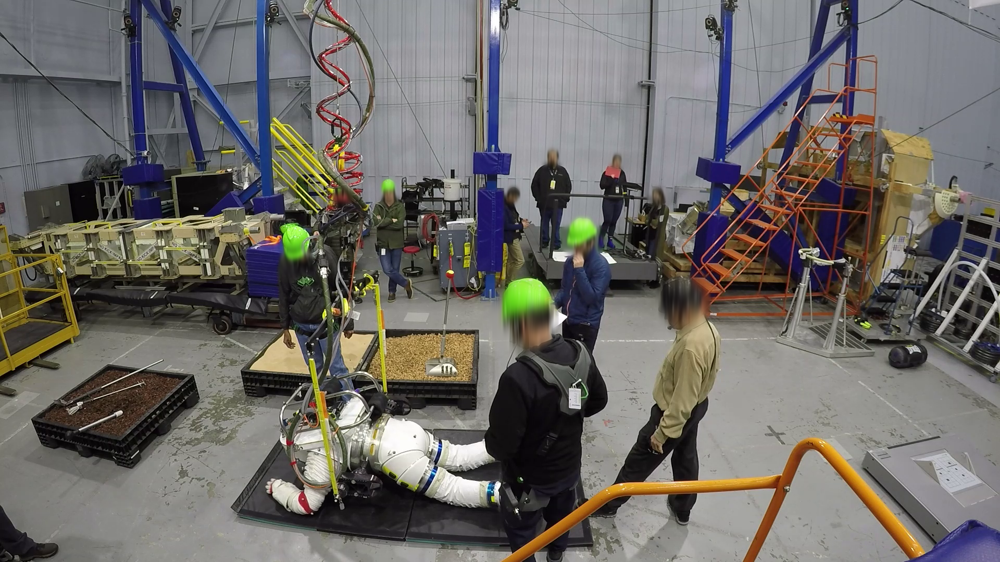

In [5]:
display(Image.fromarray(im[:,:,::-1]))

In [6]:
cfg = get_cfg()
# add project-specific config (e.g., TensorMask) here if you're not running a model in detectron2's core library
cfg.MODEL.DEVICE = "cpu"
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
# Find a model from detectron2's model zoo. You can use the https://dl.fbaipublicfiles... url as well
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
predictor = DefaultPredictor(cfg)
outputs = predictor(im)

In [7]:
print(outputs["instances"].pred_classes)
print(outputs["instances"].pred_boxes)

tensor([ 0,  0,  0,  0,  0,  0, 32,  0,  0, 56, 24, 32])
Boxes(tensor([[1148.5165,  296.6274, 1210.0779,  480.2765],
        [1069.1897,  417.7909, 1176.2272,  672.6587],
        [1155.5402,  528.2081, 1381.8851, 1023.4099],
        [ 737.6718,  532.1846, 1169.2845, 1067.1790],
        [1019.2017,  286.8765, 1098.6404,  480.0699],
        [ 702.5540,  342.6302,  790.9243,  581.9346],
        [1090.8259,  417.0923, 1145.0018,  470.9604],
        [ 963.1658,  360.9894, 1013.4597,  556.2545],
        [   0.0000,  974.2411,  113.2333, 1077.8031],
        [   0.0000,  433.1716,  159.4423,  731.0315],
        [ 551.3295,  479.5097,  637.0012,  625.2732],
        [ 856.8047,  518.5748,  871.9037,  532.8135]]))


In [8]:
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

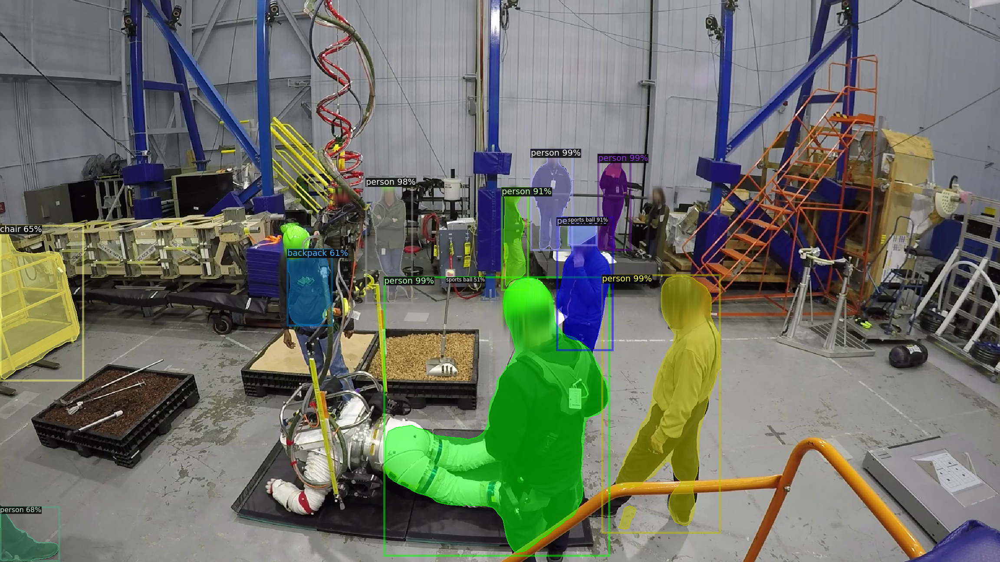

In [9]:
display(Image.fromarray(cv2.cvtColor(out.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB)))

In [10]:
cfg = get_cfg()
# add project-specific config (e.g., TensorMask) here if you're not running a model in detectron2's core library
cfg.MODEL.DEVICE = "cpu"
cfg.merge_from_file(model_zoo.get_config_file("COCO-Keypoints/keypoint_rcnn_R_50_FPN_1x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
# Find a model from detectron2's model zoo. You can use the https://dl.fbaipublicfiles... url as well
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Keypoints/keypoint_rcnn_R_50_FPN_1x.yaml")
predictor = DefaultPredictor(cfg)
outputs = predictor(im)

model_final_04e291.pkl: 237MB [02:36, 1.51MB/s]                           


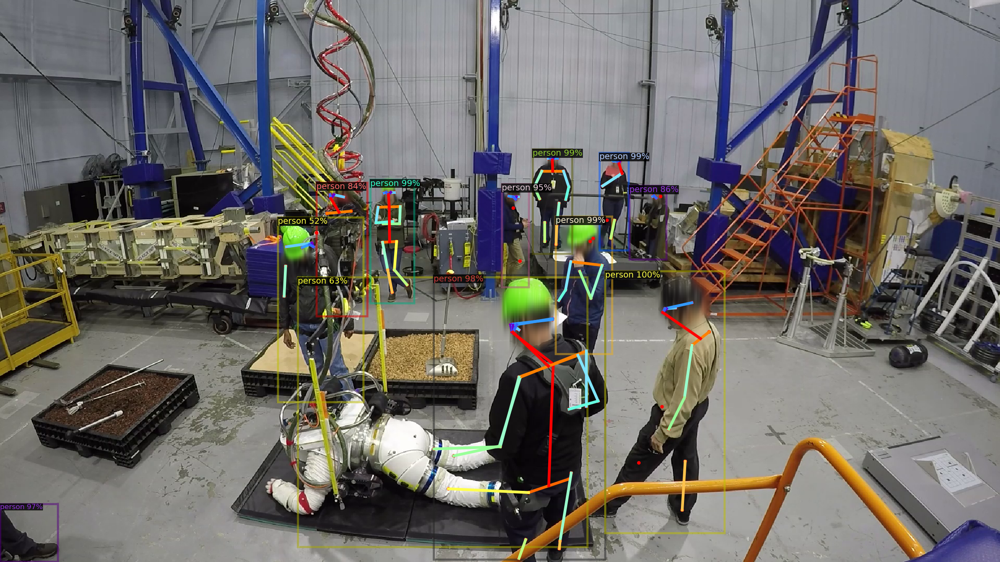

In [11]:
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

display(Image.fromarray(cv2.cvtColor(out.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB)))

## Finetune

In [31]:
ssd = DatasetCatalog.get("spacesuit_dataset")

In [33]:
len(ssd)

86

In [4]:
cfg = get_cfg()
cfg.MODEL.DEVICE = "cpu"
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("spacesuit_dataset",)
cfg.DATASETS.TEST = ()
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")

cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 300
cfg.SOLVER.STEPS = []
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 16
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1

In [41]:
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[04/22 21:30:03 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

FileNotFoundError: Caught FileNotFoundError in DataLoader worker process 0.
Original Traceback (most recent call last):
  File "/Users/rasyidridha/opt/miniconda3/lib/python3.8/site-packages/torch/utils/data/_utils/worker.py", line 202, in _worker_loop
    data = fetcher.fetch(index)
  File "/Users/rasyidridha/opt/miniconda3/lib/python3.8/site-packages/torch/utils/data/_utils/fetch.py", line 44, in fetch
    data = [self.dataset[idx] for idx in possibly_batched_index]
  File "/Users/rasyidridha/opt/miniconda3/lib/python3.8/site-packages/torch/utils/data/_utils/fetch.py", line 44, in <listcomp>
    data = [self.dataset[idx] for idx in possibly_batched_index]
  File "/Users/rasyidridha/opt/miniconda3/lib/python3.8/site-packages/detectron2/data/common.py", line 43, in __getitem__
    data = self._map_func(self._dataset[cur_idx])
  File "/Users/rasyidridha/opt/miniconda3/lib/python3.8/site-packages/detectron2/data/dataset_mapper.py", line 125, in __call__
    image = utils.read_image(dataset_dict["file_name"], format=self.image_format)
  File "/Users/rasyidridha/opt/miniconda3/lib/python3.8/site-packages/detectron2/data/detection_utils.py", line 179, in read_image
    with PathManager.open(file_name, "rb") as f:
  File "/Users/rasyidridha/opt/miniconda3/lib/python3.8/site-packages/iopath/common/file_io.py", line 921, in open
    return self.__get_path_handler(path)._open(  # type: ignore
  File "/Users/rasyidridha/opt/miniconda3/lib/python3.8/site-packages/iopath/common/file_io.py", line 581, in _open
    return open(  # type: ignore
FileNotFoundError: [Errno 2] No such file or directory: '/Users/rasyidridha/Playground/spacesuit/data/raw/train/949796.png'
